In [232]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import FunctionTransformer
from sklearn.impute import SimpleImputer
from sklearn.feature_extraction import FeatureHasher
from imblearn.over_sampling import SMOTE
import math

df = pd.read_csv('../../Resource/address_dataset_kaggle.csv', index_col=0)

columns_drop = ['Index', 'Address']
df = df.drop(columns=columns_drop)

num_cols = df.select_dtypes(include=['float64', 'int64']).columns
num_imputer = SimpleImputer(strategy='mean')
df[num_cols] = num_imputer.fit_transform(df[num_cols])

cat_cols = df.select_dtypes(include=['object']).columns
cat_imputer = SimpleImputer(strategy='most_frequent')
df[cat_cols] = cat_imputer.fit_transform(df[cat_cols])

X = df.drop(columns=['FLAG'])
y = df['FLAG']

hasher = FeatureHasher(n_features=30, input_type='string') # edit n_features to your desired number of features

cat_cols_in_X = X.select_dtypes(include=['object']).columns

for col in cat_cols_in_X:
    data_to_hash = X[col].astype(str).values.reshape(-1, 1)
    hashed_features = hasher.transform(data_to_hash).toarray()
    
    hashed_df = pd.DataFrame(hashed_features, columns=[f"{col}_hashed_{i}" for i in range(hashed_features.shape[1])])
    
    X = pd.concat([X, hashed_df], axis=1)
    X.drop(columns=[col], inplace=True)

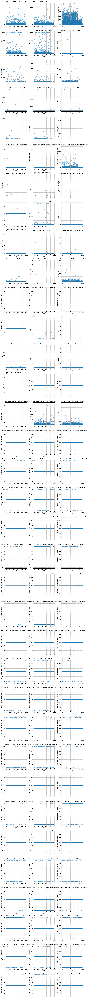

In [233]:
num_cols_in_X = X.select_dtypes(include=['float64', 'int64']).columns
n_plots = len(num_cols_in_X)
n_rows = math.ceil(n_plots / 3)

plt.figure(figsize=(15, 5 * n_rows))
for idx, col in enumerate(num_cols_in_X, 1):
    plt.subplot(n_rows, 3, idx)
    plt.scatter(range(len(X)), X[col], alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.title(f'Distribusi Data untuk {col}')
    plt.xlabel('Index')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

In [234]:
X_log = X.copy()

for col in num_cols_in_X:
    if (X_log[col] <= 0).any():
        X_log[col] = np.where(X_log[col] <= 0, 0.001, X_log[col]) 
        X_log[col] = np.log1p(X_log[col]) 
    else:
        X_log[col] = np.log(X_log[col])

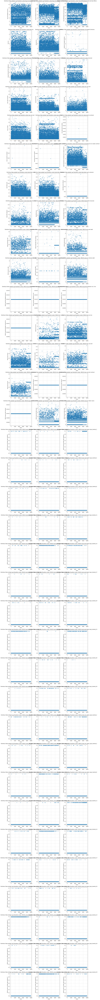

In [235]:
n_plots = len(num_cols_in_X)
n_rows = math.ceil(n_plots / 3)

plt.figure(figsize=(15, 5*n_rows))

for idx, col in enumerate(num_cols_in_X, 1):
    plt.subplot(n_rows, 3, idx)
    plt.scatter(range(len(X_log)), X_log[col], alpha=0.5)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.title(f'Distribusi Data setelah Log Transform untuk {col}')
    plt.xlabel('Index')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

c:\Users\ACER\anaconda3\envs\TA\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\ACER\anaconda3\envs\TA\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Korelasi antara fitur dan target:
Avg min between sent tnx                  -0.158174
Avg min between received tnx              -0.144056
Time Diff between first and last (Mins)   -0.219647
Sent tnx                                  -0.273825
Received Tnx                              -0.203832
                                             ...   
 ERC20_most_rec_token_type_hashed_25      -0.020743
 ERC20_most_rec_token_type_hashed_26      -0.009327
 ERC20_most_rec_token_type_hashed_27       0.094402
 ERC20_most_rec_token_type_hashed_28      -0.092129
 ERC20_most_rec_token_type_hashed_29       0.014735
Length: 105, dtype: float64


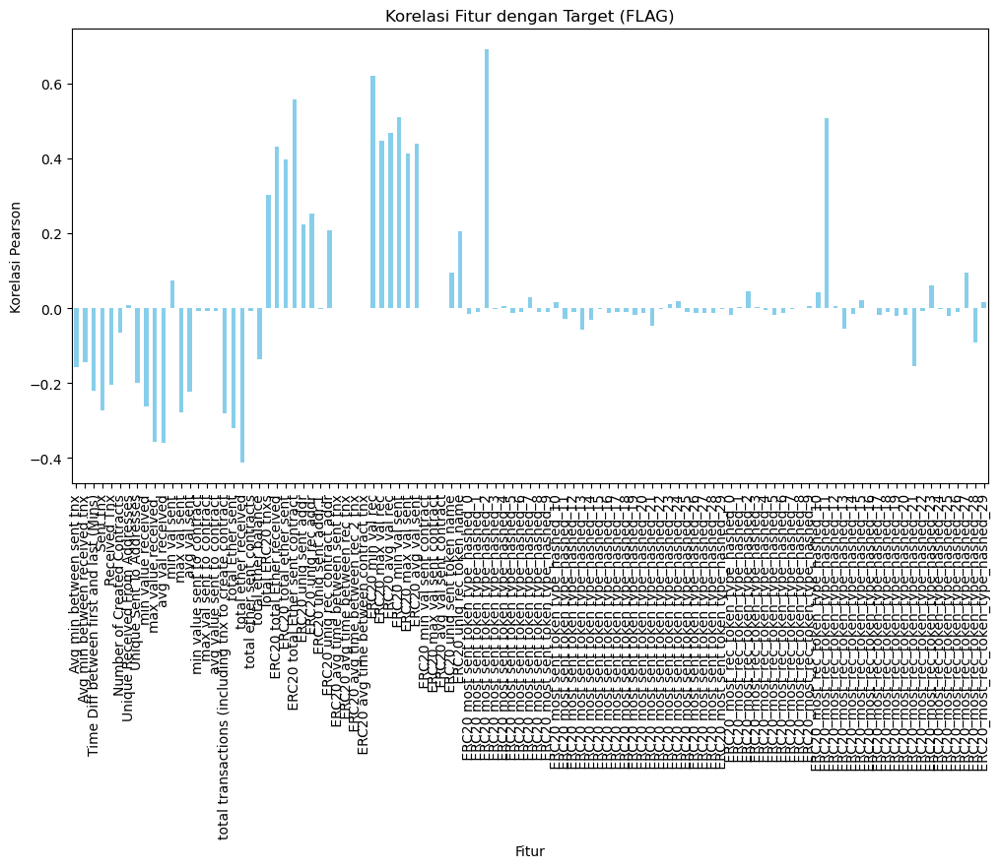

In [236]:
correlation_with_target = X_log.corrwith(y)  

print("Korelasi antara fitur dan target:")
print(correlation_with_target)

plt.figure(figsize=(12, 6))
correlation_with_target.plot(kind='bar', color='skyblue')
plt.title('Korelasi Fitur dengan Target (FLAG)')
plt.xlabel('Fitur')
plt.ylabel('Korelasi Pearson')
plt.xticks(rotation=90)
plt.show()

Fitur dengan korelasi positif lebih besar dari 0.2 dengan target (FLAG):
Total ERC20 tnxs                       0.303542
ERC20 total Ether received             0.430603
ERC20 total ether sent                 0.396801
ERC20 total Ether sent contract        0.556591
ERC20 uniq sent addr                   0.222877
ERC20 uniq rec addr                    0.252294
ERC20 uniq rec contract addr           0.206787
ERC20 min val rec                      0.621334
ERC20 max val rec                      0.446105
ERC20 avg val rec                      0.466878
ERC20 min val sent                     0.509748
ERC20 max val sent                     0.411776
ERC20 avg val sent                     0.440175
ERC20 uniq rec token name              0.206220
ERC20 most sent token type_hashed_2    0.690185
ERC20_most_rec_token_type_hashed_11    0.508454
dtype: float64


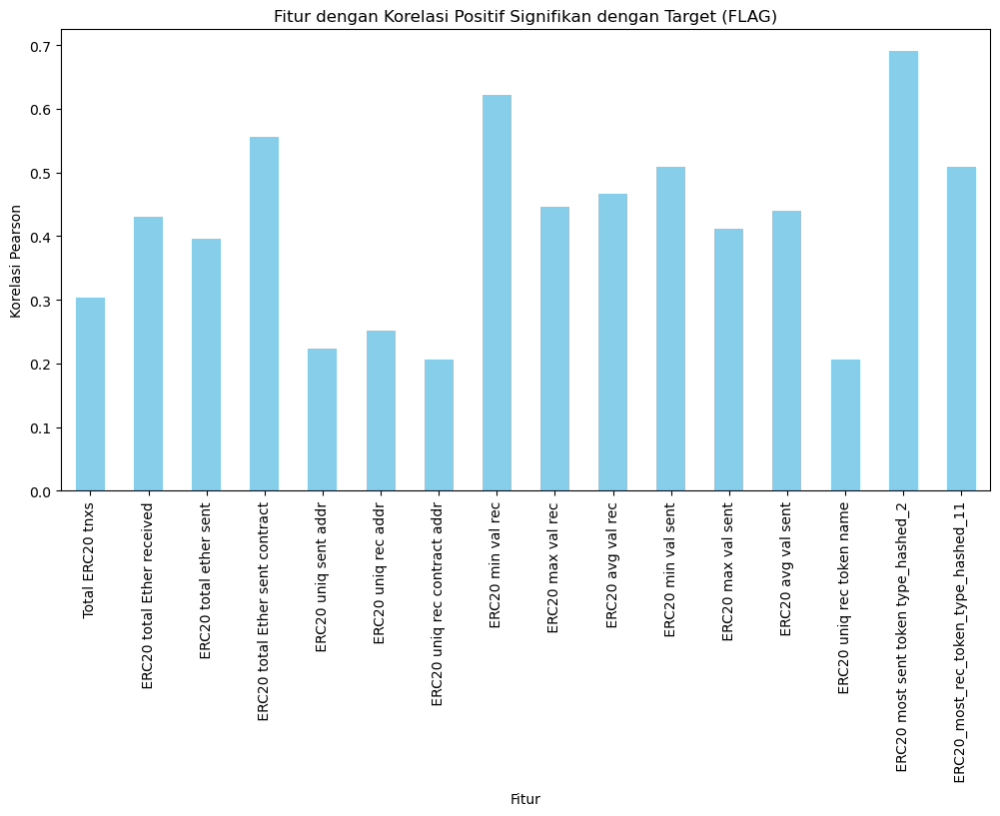

In [237]:
relevant_features = correlation_with_target[correlation_with_target > 0.1] #edit threshold here

print("Fitur dengan korelasi positif lebih besar dari 0.2 dengan target (FLAG):")
print(relevant_features)

plt.figure(figsize=(12, 6))
relevant_features.plot(kind='bar', color='skyblue')
plt.title('Fitur dengan Korelasi Positif Signifikan dengan Target (FLAG)')
plt.xlabel('Fitur')
plt.ylabel('Korelasi Pearson')
plt.xticks(rotation=90)
plt.show()

In [238]:
print("Fitur dengan korelasi positif lebih besar dari 0.2 dengan target (FLAG):")
for feature, correlation in relevant_features.items():
    print(f"{feature}: {correlation:.4f}")

Fitur dengan korelasi positif lebih besar dari 0.2 dengan target (FLAG):
 Total ERC20 tnxs: 0.3035
 ERC20 total Ether received: 0.4306
 ERC20 total ether sent: 0.3968
 ERC20 total Ether sent contract: 0.5566
 ERC20 uniq sent addr: 0.2229
 ERC20 uniq rec addr: 0.2523
 ERC20 uniq rec contract addr: 0.2068
 ERC20 min val rec: 0.6213
 ERC20 max val rec: 0.4461
 ERC20 avg val rec: 0.4669
 ERC20 min val sent: 0.5097
 ERC20 max val sent: 0.4118
 ERC20 avg val sent: 0.4402
 ERC20 uniq rec token name: 0.2062
 ERC20 most sent token type_hashed_2: 0.6902
 ERC20_most_rec_token_type_hashed_11: 0.5085


In [239]:
X = X_log[relevant_features.index]

In [240]:
X.columns

Index([' Total ERC20 tnxs', ' ERC20 total Ether received',
       ' ERC20 total ether sent', ' ERC20 total Ether sent contract',
       ' ERC20 uniq sent addr', ' ERC20 uniq rec addr',
       ' ERC20 uniq rec contract addr', ' ERC20 min val rec',
       ' ERC20 max val rec', ' ERC20 avg val rec', ' ERC20 min val sent',
       ' ERC20 max val sent', ' ERC20 avg val sent',
       ' ERC20 uniq rec token name', ' ERC20 most sent token type_hashed_2',
       ' ERC20_most_rec_token_type_hashed_11'],
      dtype='object')

In [241]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [242]:
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

In [243]:
X_train_smote.to_csv("../../Data/pearson-corr/n=30/0.1/X_train_smote.csv", index=False)
X_test.to_csv("../../Data/pearson-corr/n=30/0.1/X_test.csv", index=False)
y_train_smote.to_csv("../../Data/pearson-corr/n=30/0.1/y_train_smote.csv", index=False)
y_test.to_csv("../../Data/pearson-corr/n=30/0.1/y_test.csv", index=False)

In [244]:
print(X_train_smote.shape)
print(X_test.shape)
print(y_train_smote.shape)
print(y_test.shape)

(12240, 16)
(1969, 16)
(12240,)
(1969,)
